### Notebook for the generation of an annotated manifold for MultiC cells with `scANVI` 

- **Developed by:** Carlos Talavera-López Ph.D
- **Institute of Systems Immunology (WüSI) - JMU-Würzburg**
- v230609

### Import required modules

In [1]:
import scvi
import torch
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from scib_metrics.benchmark import Benchmarker

/opt/saturncloud/envs/scvi-tools/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/opt/saturncloud/envs/scvi-tools/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.9.1
scanpy      1.9.3
-----
PIL                 9.5.0
absl                NA
aiohttp             3.8.4
aiosignal           1.3.1
anyio               NA
asttokens           NA
async_timeout       4.0.2
attr                23.1.0
backcall            0.2.0
bs4                 4.12.2
certifi             2023.05.07
charset_normalizer  3.1.0
chex                0.1.7
click               8.1.3
comm                0.1.3
contextlib2         NA
croniter            NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
deepdiff            6.3.0
docrep              0.3.2
etils               1.3.0
executing           1.2.0
fastapi             0.88.0
flax                0.6.10
frozenlist          1.3.3
fsspec              2023.5.0
h5py                3.8.0
idna                3.4
importlib_resources NA
ipykernel           6.23.1
ipywidgets          8.0.6
jax                 0.4.12
jaxlib              0.4.

In [3]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'
torch.set_float32_matmul_precision('medium')

Global seed set to 1712


In [4]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 3,
)

### Read in Healthy data

In [5]:
epith_all = sc.read_h5ad('../../../data/Marburg_All_ctl230404_leiden_states.raw.h5ad')
epith_all

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_coun

In [6]:
epith_all.obs['leiden_states'].cat.categories

Index(['Goblet_0', 'Club_1', 'SupraB_2', 'Basal_3', 'SupraB_4', 'SupraB_5',
       'Goblet_6', 'Goblet_7', 'Basal_8', 'Club_9', 'MultiC_10', 'Mixed_11',
       'Mixed_12', 'Mixed_13', 'SupraB_14', 'SupraB_15', 'Mixed_16',
       'Mixed_17', 'Club_18'],
      dtype='object')

In [7]:
epith_MultiC = epith_all[epith_all.obs['leiden_states'].isin(['MultiC_10'])]
epith_MultiC

View of AnnData object with n_obs × n_vars = 4645 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_

In [8]:
epith_MultiC.obs['seed_labels'] = epith_MultiC.obs['C_scANVI'].copy()
epith_MultiC.obs['seed_labels'].value_counts()

seed_labels
Multiciliated    4248
Goblet            264
Club               91
Suprabasal         41
Basal resting       1
Name: count, dtype: int64

### Relabel cells for annotation

In [9]:
non_healthy_ctrl_indices = epith_MultiC.obs['group'] != 'healthy_ctrl'
epith_MultiC.obs['seed_labels'] = epith_MultiC.obs['seed_labels'].cat.add_categories('Unknown')
epith_MultiC.obs.loc[non_healthy_ctrl_indices, 'seed_labels'] = 'Unknown'
epith_MultiC.obs['seed_labels'].value_counts()

seed_labels
Unknown          3152
Multiciliated    1365
Goblet            100
Club               15
Suprabasal         13
Basal resting       0
Name: count, dtype: int64

### Recalculate IAV-score

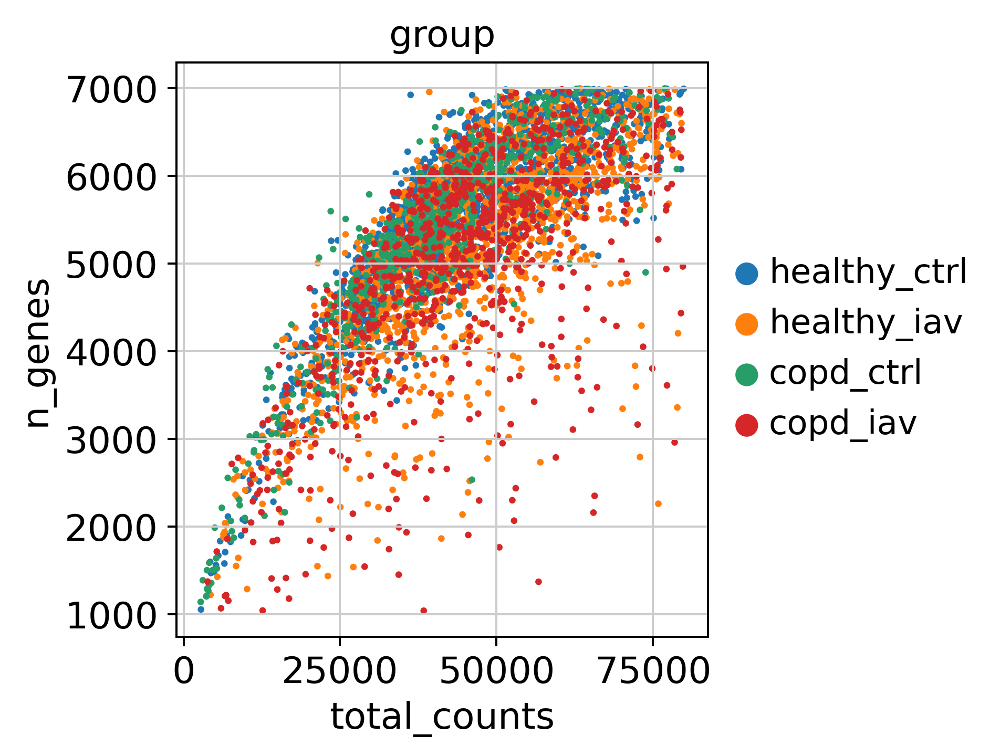

In [10]:
sc.pl.scatter(epith_MultiC, x = 'total_counts', y = 'n_genes', color = "group", frameon = False)

In [11]:
nc_genes = epith_MultiC.var_names[epith_MultiC.var_names.str.startswith('NC_')]
print(nc_genes)

Index(['NC_026431.1', 'NC_026432.1', 'NC_026433.1', 'NC_026434.1',
       'NC_026435.1', 'NC_026436.1', 'NC_026437.1', 'NC_026438.1'],
      dtype='object')


In [12]:
adata_log = epith_MultiC.copy()

In [13]:
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)
sc.tl.score_genes(adata_log, nc_genes, score_name = 'Viral_score')

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['BPIFA1', 'MALAT1', 'MT-ATP6', 'MT-CO1', 'MT-CO2', 'MT-CO3', 'MT-ND2', 'MT-ND3', 'MT-ND4', 'MTRNR2L12', 'MTRNR2L8', 'NC_026431.1', 'NC_026432.1', 'NC_026433.1', 'NC_026434.1', 'NC_026435.1', 'NC_026436.1', 'NC_026437.1', 'NC_026438.1', 'SAA1', 'SCGB1A1', 'SLPI']
    finished (0:00:00)
computing score 'Viral_score'
    finished: added
    'Viral_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)


In [14]:
epith_MultiC.obs['Viral_score'] = adata_log.obs['Viral_score'].copy()
adata = epith_MultiC.copy()

### Select HVGs

In [15]:
adata_raw = epith_MultiC.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "donor",
    subset = True
)
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 4645 × 7000
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_coun

### Transfer of annotation with scANVI

In [16]:
scvi.model.SCVI.setup_anndata(adata, categorical_covariate_keys = ["donor"], labels_key = "seed_labels", layer = 'counts')

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [17]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [18]:
scvi_model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [02:48<00:00,  2.43it/s, v_num=1, train_loss_step=4.49e+3, train_loss_epoch=4.6e+3] 

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:48<00:00,  2.37it/s, v_num=1, train_loss_step=4.49e+3, train_loss_epoch=4.6e+3]


### Label transfer with `scANVI` 

In [19]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [20]:
scanvi_model.train()

INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 10/10: 100%|██████████| 10/10 [00:09<00:00,  1.03it/s, v_num=1, train_loss_step=4.74e+3, train_loss_epoch=4.63e+3]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [00:09<00:00,  1.02it/s, v_num=1, train_loss_step=4.74e+3, train_loss_epoch=4.63e+3]


In [21]:
adata.obs["C_scANVI_v2"] = scanvi_model.predict(adata)

- Extract latent representation

In [22]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

- Visualise corrected dataset

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


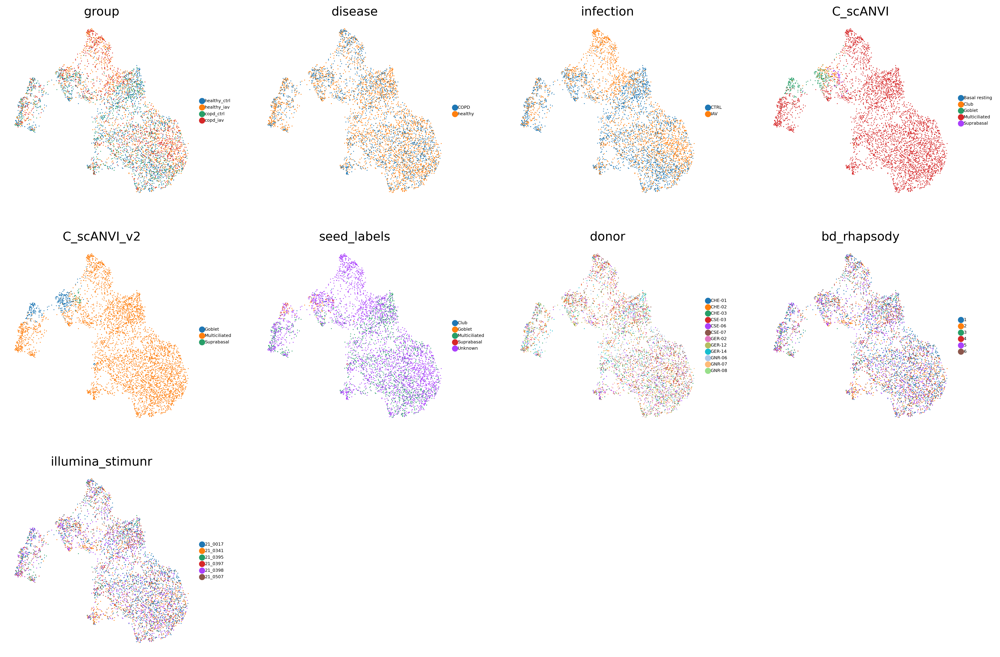

In [26]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.3, spread = 2, random_state = 1712)
sc.pl.umap(adata, frameon = False, color = ['group', 'disease', 'infection', 'C_scANVI', 'C_scANVI_v2', 'seed_labels', 'donor', 'bd_rhapsody', 'illumina_stimunr'], size = 4, legend_fontsize = 5, ncols = 4)

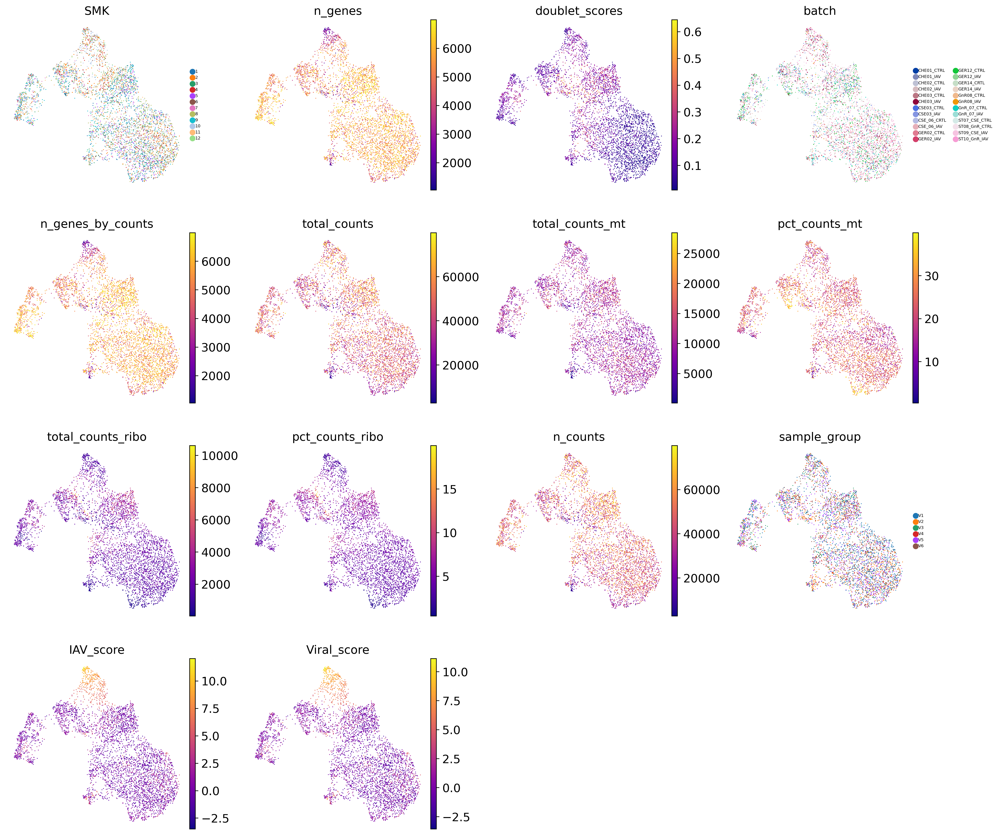

In [27]:
sc.pl.umap(adata, frameon = False, color = ['SMK', 'n_genes', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_counts', 'sample_group', 'IAV_score', 'Viral_score'], size = 4, legend_fontsize = 5, ncols = 4, cmap = 'plasma')

### Visualise individual genes using new manifold 

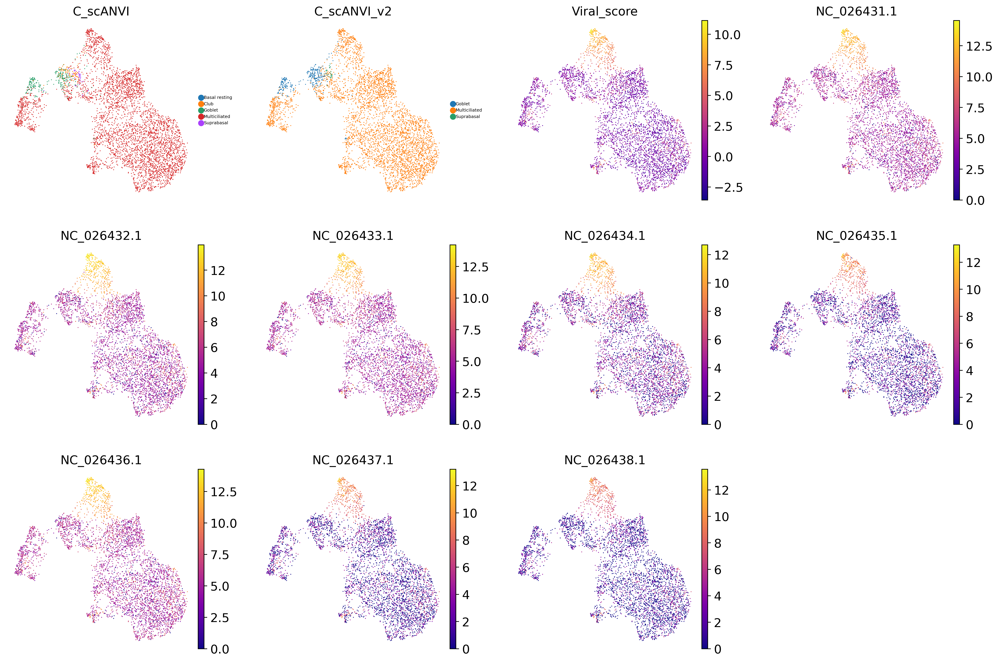

In [29]:
adata_log.obs['C_scANVI_v2'] = adata.obs['C_scANVI_v2'].copy()
adata_log.obsm['X_scVI'] = adata.obsm['X_scVI'].copy()
adata_log.obsm['X_umap'] = adata.obsm['X_umap'].copy()
adata_log.obsm['X_scANVI'] = adata.obsm['X_scANVI'].copy()

sc.pl.umap(adata_log, frameon = False, color = ['C_scANVI', 'C_scANVI_v2', 'Viral_score', 'NC_026431.1', 'NC_026432.1', 'NC_026433.1', 'NC_026434.1', 'NC_026435.1', 'NC_026436.1', 'NC_026437.1', 'NC_026438.1'], size = 4, legend_fontsize = 5, ncols = 4, cmap = 'plasma')

### Compute integration metrics

In [ ]:
bm = Benchmarker(
    adata,
    batch_key = ["donor"],
    label_key = "C_scANVI_v2",
    embedding_obsm_keys = ["X_pca", "X_scVI", "X_scANVI"],
    n_jobs = -1,
)
bm.benchmark()

In [ ]:
bm.plot_results_table(min_max_scale = False)

### Export annotated sample object 

In [30]:
adata.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata.obs.index])
adata.obs.index

Index(['493638-ST07_CSE_CTRL-V1', '816750-ST07_CSE_CTRL-V1',
       '678000-ST07_CSE_CTRL-V1', '247802-ST07_CSE_CTRL-V1',
       '177433-ST07_CSE_CTRL-V1', '767740-ST07_CSE_CTRL-V1',
       '183623-ST07_CSE_CTRL-V1', '585589-ST07_CSE_CTRL-V1',
       '57505-ST07_CSE_CTRL-V1', '37357-ST07_CSE_CTRL-V1',
       ...
       '1344386-CSE03_IAV-V6', '6811469-CSE03_IAV-V6', '5906311-CSE03_IAV-V6',
       '4448713-CSE03_IAV-V6', '11092261-CSE03_IAV-V6', '7406666-CSE03_IAV-V6',
       '3549699-CSE03_IAV-V6', '298450-CSE03_IAV-V6', '8733006-CSE03_IAV-V6',
       '10787783-CSE03_IAV-V6'],
      dtype='object', length=4645)

In [31]:
adata_raw.obs.index = pd.Index(['-'.join(idx.split('-')[:3]) for idx in adata_raw.obs.index])
adata_raw.obs.index

Index(['493638-ST07_CSE_CTRL-V1', '816750-ST07_CSE_CTRL-V1',
       '678000-ST07_CSE_CTRL-V1', '247802-ST07_CSE_CTRL-V1',
       '177433-ST07_CSE_CTRL-V1', '767740-ST07_CSE_CTRL-V1',
       '183623-ST07_CSE_CTRL-V1', '585589-ST07_CSE_CTRL-V1',
       '57505-ST07_CSE_CTRL-V1', '37357-ST07_CSE_CTRL-V1',
       ...
       '1344386-CSE03_IAV-V6', '6811469-CSE03_IAV-V6', '5906311-CSE03_IAV-V6',
       '4448713-CSE03_IAV-V6', '11092261-CSE03_IAV-V6', '7406666-CSE03_IAV-V6',
       '3549699-CSE03_IAV-V6', '298450-CSE03_IAV-V6', '8733006-CSE03_IAV-V6',
       '10787783-CSE03_IAV-V6'],
      dtype='object', length=4645)

In [32]:
adata.obs_names

Index(['493638-ST07_CSE_CTRL-V1', '816750-ST07_CSE_CTRL-V1',
       '678000-ST07_CSE_CTRL-V1', '247802-ST07_CSE_CTRL-V1',
       '177433-ST07_CSE_CTRL-V1', '767740-ST07_CSE_CTRL-V1',
       '183623-ST07_CSE_CTRL-V1', '585589-ST07_CSE_CTRL-V1',
       '57505-ST07_CSE_CTRL-V1', '37357-ST07_CSE_CTRL-V1',
       ...
       '1344386-CSE03_IAV-V6', '6811469-CSE03_IAV-V6', '5906311-CSE03_IAV-V6',
       '4448713-CSE03_IAV-V6', '11092261-CSE03_IAV-V6', '7406666-CSE03_IAV-V6',
       '3549699-CSE03_IAV-V6', '298450-CSE03_IAV-V6', '8733006-CSE03_IAV-V6',
       '10787783-CSE03_IAV-V6'],
      dtype='object', length=4645)

In [33]:
adata.obs['C_scANVI_v2'].cat.categories

Index(['Goblet', 'Multiciliated', 'Suprabasal'], dtype='object')

In [34]:
adata.obs['C_scANVI_v2'].value_counts()

C_scANVI_v2
Multiciliated    4303
Goblet            314
Suprabasal         28
Name: count, dtype: int64

### Export annotated object with raw counts

In [35]:
adata

AnnData object with n_obs × n_vars = 4645 × 7000
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-

In [36]:
adata_raw

AnnData object with n_obs × n_vars = 4645 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_cou

In [37]:
adata_export = anndata.AnnData(X = adata_raw.X, obs = adata.obs, var = adata_raw.var)
adata_export.obsm['X_scVI'] = adata.obsm['X_scVI'].copy()
adata_export.obsm['X_umap'] = adata.obsm['X_umap'].copy()
adata_export.obsm['X_scANVI'] = adata.obsm['X_scANVI'].copy()
adata_export

AnnData object with n_obs × n_vars = 4645 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts

In [39]:
adata_export.write('../../../data/Epithelial_MultiC_ctl230609_scANVI_annotated.raw.h5ad')